In [1]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import cv2
import json
import os


In [ ]:
# Load the test masks

import re
import os
import numpy as np
from PIL import Image

def atoi(text):
    return int(text) if text.isdigit() else text

def natural_keys(text):
    return [atoi(c) for c in re.split(r'(\d+)', text)]
    
# Define path to masks of test images
path = '/home/yiming/WorkSpace/CenterSAM_Cellpose/masks/test'


# List all files and filter out .png images
all_files = os.listdir(path)
png_files = sorted([f for f in all_files if f.endswith('.png')], key=natural_keys) # Use natural key for sort

images = []

for file in png_files:
    img_path = os.path.join(path, file)
    print(img_path)
    
    img = Image.open(img_path)
    img_array = np.array(img).reshape(333, 333, 1)
    images.append(img_array)

y_true = np.array(images)

print(y_true.shape)

In [3]:
# Define the path of test images
path = '/home/yiming/WorkSpace/CenterSAM_Cellpose/images/test'

all_files = os.listdir(path)
png_files = sorted([f for f in all_files if f.endswith('.png')]) 

images = []

for file in png_files:
    img_path = os.path.join(path, file)
    img = Image.open(img_path)
    img_array = np.array(img)
    images.append(img_array)

X_test = np.array(images)

print(X_test.shape)

(126, 333, 333, 3)


In [4]:
# Basic count of number of images and annotations
total_image_count = y_true.shape[0]
ground_truth_masks_count = 0
for i in range(total_image_count):
    ground_truth_masks_count += len(np.unique(y_true[i]))



print('Toal nuclei masks in ground truth:' , ground_truth_masks_count)
# ground_truth_masks_count = sum(len(detection) for detection in y_true)
# print(ground_truth_masks_count)

Toal nuclei masks in ground truth: 7470


## Example image

In [5]:
# summarize the detect results in a json variable
with open('/home/yiming/WorkSpace/CenterSAM_Cellpose/demo_results/MoNuSeg_results.json', 'r') as f:
    detec_results = json.load(f)

json_image_names = list(detec_results.keys())
print(len(json_image_names))


126


In [6]:
json_image_names[0]

'/home/yiming/WorkSpace/CenterNet_Cellpose/images/test/TCGA-2Z-A9J9-01A-01-TS1-1.png'

In [7]:
threshold = 0.365
filtered_data = {}
masks_counter = 0

# Iterate over each key-value pair in the original dictionary
for k, v in detec_results.items():
    # Extract the filename portion
    file_name = os.path.basename(k)

    # Filter values where the element is less than the threshold value
    filtered_v = [lst[:4] for lst in v if lst[-1] > threshold]


    # Add the result to the new dictionary
    filtered_data[file_name] = filtered_v
    
    masks_counter += np.shape(filtered_v)[0]

print('Toal nucleis masks count after filter', masks_counter)


Toal nucleis masks count after filter 7494


## Selecting objects with SAM

First, load the SAM model and predictor. Change the path below to point to the SAM checkpoint. Running on CUDA and using the default model are recommended for best results.

In [8]:
# For single GPU
import sys
import time

import torch
import torch.nn as nn
from segment_anything import sam_model_registry, SamPredictor
# torch.cuda.set_device(2)

# Load the pretrained VIT_H checkpoint
sam_checkpoint = "sam_vit_h_4b8939.pth"
model_type = "vit_h"

# You may choose other SAM model if you wish
# sam_checkpoint = "sam_vit_b_01ec64.pth"
# model_type = "vit_b"

# sam_checkpoint = "sam_vit_l_0b3195.pth"
# model_type = "vit_l"

device = "cuda"

# Create SAM and send to the device
sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)

# Instantiating the SAM predictor
predictor = SamPredictor(sam)

In [9]:
# inference the test image according to their file name to make sure the right orider

combined_masks = []
image_counter = 0
total_annotation_process = 0
start_time = time.time()
for image_path in json_image_names:

    
    image_counter += 1
    print(f"Processing image {image_counter} of {len(json_image_names)}")

    image_name = os.path.basename(image_path)

    # Read images and perform color space conversion
#     image = cv2.imread(target_image_folder + image_name)
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Set the input image for the predictor
    predictor.set_image(image)

    # Get input boxes from the filtered data dictionary

    print(len(filtered_data[image_name]))
    total_annotation_process += len((filtered_data[image_name]))

    input_boxes = torch.tensor(filtered_data[image_name], device=predictor.device)

    # Send the input box to the default device
    input_boxes = input_boxes.to(device=device)

    # Predict the masks using SAM
    transformed_boxes = predictor.transform.apply_boxes_torch(input_boxes, image.shape[:2])
    masks, _, _ = predictor.predict_torch(
        point_coords=None,
        point_labels=None,
        boxes=transformed_boxes,
        multimask_output=False,
    )
    print(masks.shape)

    # Processing masks here
    # Remeber to change the shape to match the image shape
    combined_mask = np.zeros((333, 333), dtype=np.uint16)


    for idx, mask in enumerate(masks):

        mask_bool = mask.squeeze().cpu().numpy().astype(bool)
        combined_mask[mask_bool] = idx + 1  # Assign a different integer label to each mask

    # Add a dimension to later convert the list to a four-dimensional numpy array
    combined_mask = combined_mask[..., np.newaxis]

    # Add the merged mask to the list
    combined_masks.append(combined_mask)
    current_time = time.time()
    elapsed_time = current_time - start_time
    print('Speed:', total_annotation_process/elapsed_time)



combined_masks = np.stack(combined_masks)
print(np.shape(combined_masks))

Processing image 1 of 126
67
torch.Size([67, 1, 333, 333])
Speed: 93.6735074968908
Processing image 2 of 126
98
torch.Size([98, 1, 333, 333])
Speed: 132.34501871410072
Processing image 3 of 126
79
torch.Size([79, 1, 333, 333])
Speed: 138.3523119977191
Processing image 4 of 126
77
torch.Size([77, 1, 333, 333])
Speed: 140.94012775952075
Processing image 5 of 126
81
torch.Size([81, 1, 333, 333])
Speed: 143.70598348000584
Processing image 6 of 126
76
torch.Size([76, 1, 333, 333])
Speed: 144.36863853410995
Processing image 7 of 126
76
torch.Size([76, 1, 333, 333])
Speed: 144.77786972122445
Processing image 8 of 126
77
torch.Size([77, 1, 333, 333])
Speed: 145.34063230998728
Processing image 9 of 126
79
torch.Size([79, 1, 333, 333])
Speed: 146.12472465041913
Processing image 10 of 126
113
torch.Size([113, 1, 333, 333])
Speed: 152.22483633429388
Processing image 11 of 126
88
torch.Size([88, 1, 333, 333])
Speed: 153.5740980843324
Processing image 12 of 126
64
torch.Size([64, 1, 333, 333])
Speed

Process the image to produce an image embedding by calling `SamPredictor.set_image`. `SamPredictor` remembers this embedding and will use it for subsequent mask prediction.

In [10]:
# Save final combined mask locally as npy file

save_path = "/home/yiming/WorkSpace/CenterSAM_Cellpose/demo_results/SAM_on_bbox_final_combined_masks.npy"
np.save(save_path, combined_masks)

In [11]:
# Define function for visulization

def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)
    
def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)   
    
def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0,0,0,0), lw=2))    


In [ ]:
# Improt json of original detection results

import json
with open('/home/yiming/WorkSpace/CenterSAM_Cellpose/demo_results/MoNuSeg_results.json', 'r') as f:
    detec_results = json.load(f)

images = list(detec_results.keys())

for image in images:
    print(image)

## Define the evaluation metric

In [13]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.segmentation import find_boundaries

def match_pred_to_true(y_true, y_pred, iou_threshold=0.5):
    """Find for each predicted instance the real instance that best matches it.""""
    true_ids = list(np.unique(y_true))
    pred_ids = list(np.unique(y_pred))
    
    true_ids.remove(0)  # remove background
    pred_ids.remove(0)  # remove background
    
    best_matches = {}
    
    for pred_id in pred_ids:
        best_iou = 0
        best_true_id = None
        for true_id in true_ids:
            intersection = np.sum((y_pred == pred_id) & (y_true == true_id))
            union = np.sum((y_pred == pred_id) | (y_true == true_id))
            iou = intersection / union
            if iou > best_iou:
                best_iou = iou
                best_true_id = true_id
        
        if best_iou > iou_threshold:
            best_matches[pred_id] = best_true_id
            true_ids.remove(best_true_id)  # remove this true_id so it can't be matched again
    
    return best_matches

def compute_instance_metrics(y_true, y_pred):
    matches = match_pred_to_true(y_true, y_pred)
    TP = len(matches)
    FN = len(np.unique(y_true)) - 1 - TP  # subtract 1 for background
    FP = len(np.unique(y_pred)) - 1 - TP  # subtract 1 for background
    TN = 0  # No true negatives in instance segmentation
    
    jaccard = TP / (TP + FP + FN)
    precision = TP / (TP + FP)
    recall = TP / (TP + FN)
    f1 = 2 * (precision * recall) / (precision + recall)
    dice = 2 * TP / (2 * TP + FP + FN)
    ious = []
    for pred_id, true_id in matches.items():
        intersection = np.sum((y_pred == pred_id) & (y_true == true_id))
        union = np.sum((y_pred == pred_id) | (y_true == true_id))
        iou = intersection / union
        ious.append(iou)
    
    return recall, precision, jaccard, f1, dice, matches, ious

    
def visualize_comparison(X_orig, y_true, y_pred, index):
    fig, ax = plt.subplots(1, 2, figsize=(20, 6))
    
    ax[0].imshow(y_true, cmap='tab20b')
    ax[0].set_title('Ground Truth Segmentation')
    
    ax[1].imshow(y_pred, cmap='tab20b')
    ax[1].set_title('Prediction Segmentation')
    
    # Compute metrics
    recall, precision, jaccard, f1, dice, matches, _ = compute_instance_metrics(y_true, y_pred)  # 添加 _ 来接收多余的返回值
    metrics_text = f"recall: {recall:.5f}\nPrecision: {precision:.5f}\nJaccard: {jaccard:.5f}\nF1 Score: {f1:.5f}\nDice Score: {dice:.5f}"
    fig.text(0.5, 0.04, metrics_text, ha='center')
    
    plt.savefig(f"comparison_{index}.png")
    # plt.show()

def compute_seg(y_true, y_pred):
    """Compute the SEG score"""
    matches = match_pred_to_true(y_true, y_pred)
    total_iou = 0
    for pred_id, true_id in matches.items():
        intersection = np.sum((y_pred == pred_id) & (y_true == true_id))
        union = np.sum((y_pred == pred_id) | (y_true == true_id))
        iou = intersection / union
        total_iou += iou
        
    seg_score = total_iou / len(matches) if matches else 0
    return seg_score

def compute_aji(y_true, y_pred):
    """Compute the Aggregated Jaccard Index (AJI)"""
    true_ids = list(np.unique(y_true))
    pred_ids = list(np.unique(y_pred))
    
    true_ids.remove(0)  # remove background
    pred_ids.remove(0)  # remove background
    
    union_total = 0
    intersection_total = 0
    already_matched = []
    
    for pred_id in pred_ids:
        best_iou = 0
        best_true_id = None
        for true_id in true_ids:
            if true_id in already_matched:
                continue
            
            intersection = np.sum((y_pred == pred_id) & (y_true == true_id))
            union = np.sum((y_pred == pred_id) | (y_true == true_id))
            iou = intersection / union
            
            if iou > best_iou:
                best_iou = iou
                best_true_id = true_id

        if best_true_id is not None:
            intersection_total += np.sum((y_pred == pred_id) & (y_true == best_true_id))
            union_total += np.sum((y_pred == pred_id) | (y_true == best_true_id))
            already_matched.append(best_true_id)
    
    # Consider the unmatched true instances
    for true_id in true_ids:
        if true_id not in already_matched:
            union_total += np.sum(y_true == true_id)

    aji_score = intersection_total / union_total
    return aji_score



## Start Evaluating CenterSAM on Cellpose Dataset

In [14]:
y_true.shape

(126, 333, 333, 1)

In [15]:
# Load the predict masks
CenterSAM_predict_result = np.load('/home/yiming/WorkSpace/CenterSAM_Cellpose/demo_results/SAM_on_bbox_final_combined_masks.npy')

In [16]:
CenterSAM_predict_result.shape

(126, 333, 333, 1)

In [ ]:
# This section is for limited test with N images

X = 10

for i, (orig_img, true_img, pred_img) in enumerate(zip(X_test, y_true, CenterSAM_predict_result)):
    if i >= X:
        break
    
    print(f"Processing image {i + 1}/{X}...")
    visualize_comparison(orig_img, true_img.squeeze(), pred_img.squeeze(), i)


Processing image 1/126...
AJI: 0.6821796237131701
SEG: 0.7352966171636256
recall: 0.7397260273972602
precision: 0.8059701492537313
jaccard: 0.9
f1: 0.8503937007874016
dice: 0.8503937007874016
Processing image 2/126...
AJI: 0.6783040342264761
SEG: 0.7492274613541788
recall: 0.631578947368421
precision: 0.7346938775510204
jaccard: 0.8181818181818182
f1: 0.7741935483870968
dice: 0.7741935483870968
Processing image 3/126...
AJI: 0.7234755416573598
SEG: 0.7583469142127861
recall: 0.7159090909090909
precision: 0.7974683544303798
jaccard: 0.875
f1: 0.8344370860927153
dice: 0.8344370860927153
Processing image 4/126...
AJI: 0.7212272711707701
SEG: 0.7447916200231225
recall: 0.735632183908046
precision: 0.8311688311688312
jaccard: 0.8648648648648649
f1: 0.847682119205298
dice: 0.847682119205298
Processing image 5/126...
AJI: 0.7046306740237174
SEG: 0.7521445185463554
recall: 0.6739130434782609
precision: 0.7654320987654321
jaccard: 0.8493150684931506
f1: 0.8051948051948052
dice: 0.80519480519480

/tmp/ipykernel_3643390/365352143.py:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1, 2, figsize=(20, 6))


AJI: 0.6286194208926572
SEG: 0.7174555251858304
recall: 0.6578947368421053
precision: 0.8064516129032258
jaccard: 0.78125
f1: 0.7936507936507936
dice: 0.7936507936507936
Processing image 22/126...
AJI: 0.6326454345388863
SEG: 0.7652071179940111
recall: 0.5555555555555556
precision: 0.7142857142857143
jaccard: 0.7142857142857143
f1: 0.7142857142857143
dice: 0.7142857142857143
Processing image 23/126...
AJI: 0.6022492846210155
SEG: 0.744410134165287
recall: 0.6296296296296297
precision: 0.7727272727272727
jaccard: 0.7727272727272727
f1: 0.7727272727272727
dice: 0.7727272727272727
Processing image 24/126...
AJI: 0.6891065317119348
SEG: 0.7597945345151733
recall: 0.7272727272727273
precision: 0.8421052631578947
jaccard: 0.8421052631578947
f1: 0.8421052631578947
dice: 0.8421052631578947
Processing image 25/126...
AJI: 0.6005338926494422
SEG: 0.7480787096987564
recall: 0.4745762711864407
precision: 0.56
jaccard: 0.7567567567567568
f1: 0.6436781609195402
dice: 0.6436781609195402
Processing im

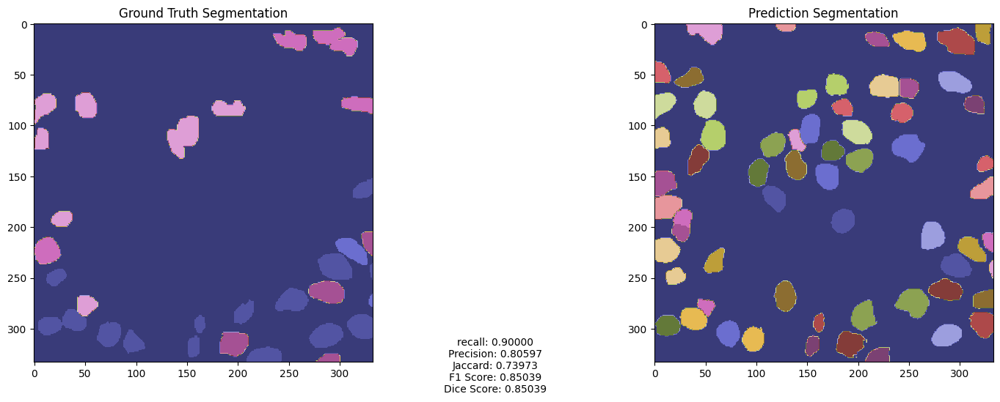

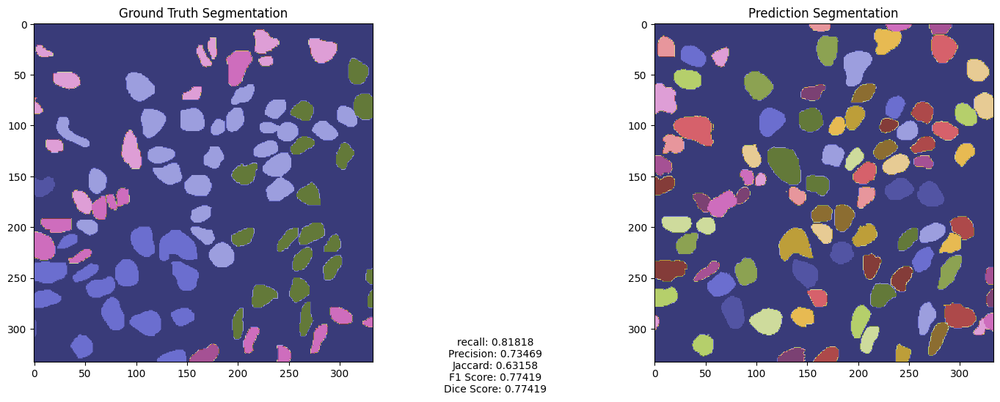

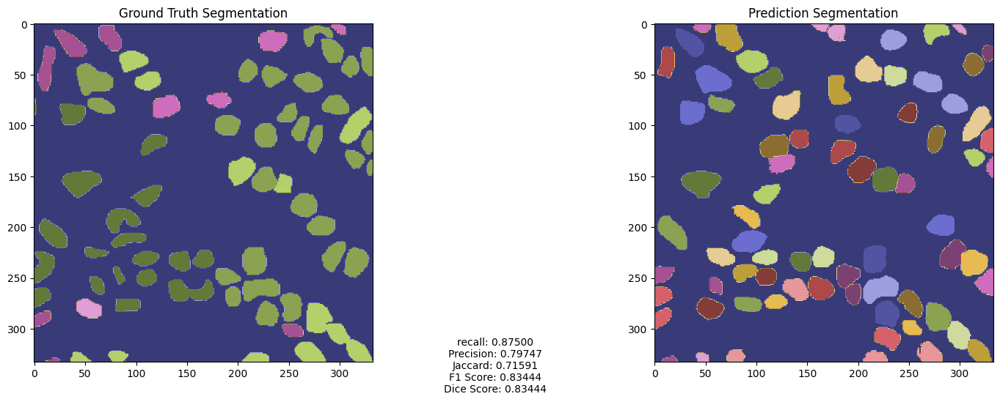

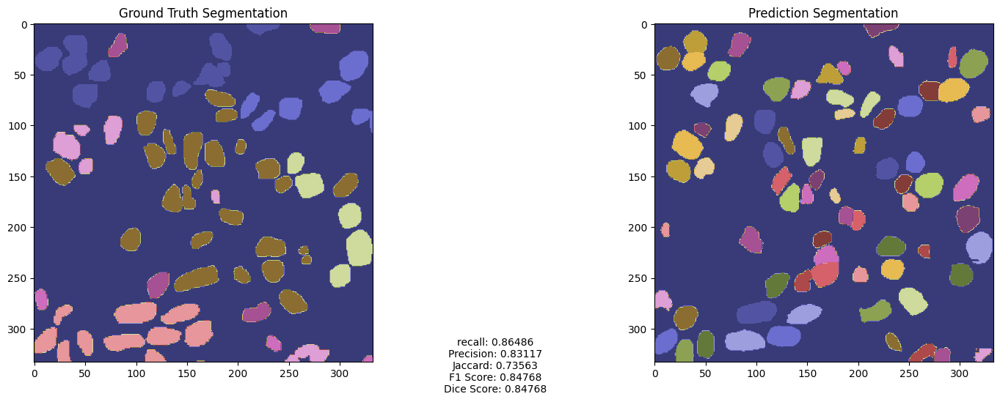

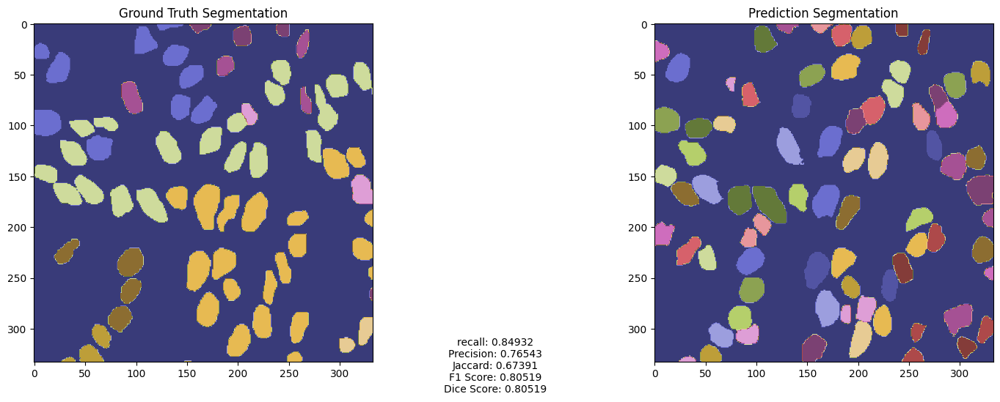

...

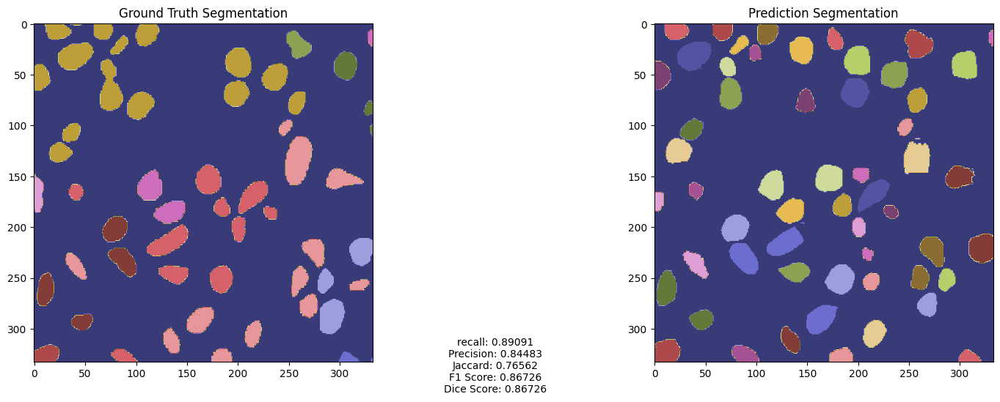

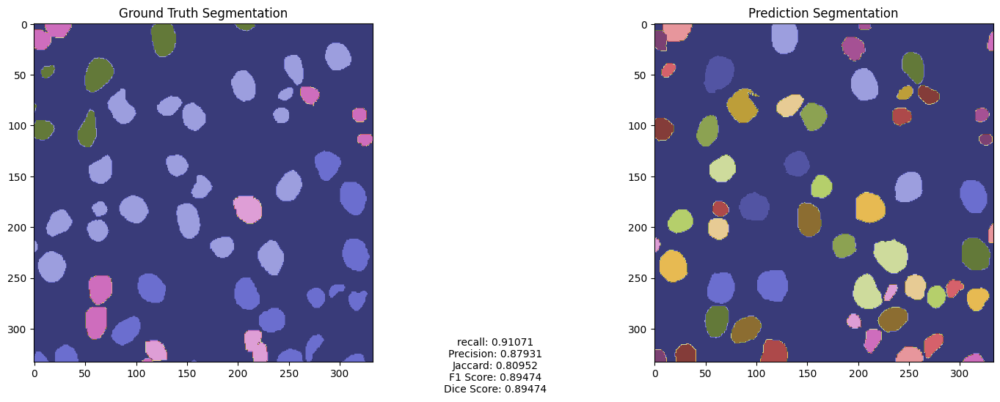

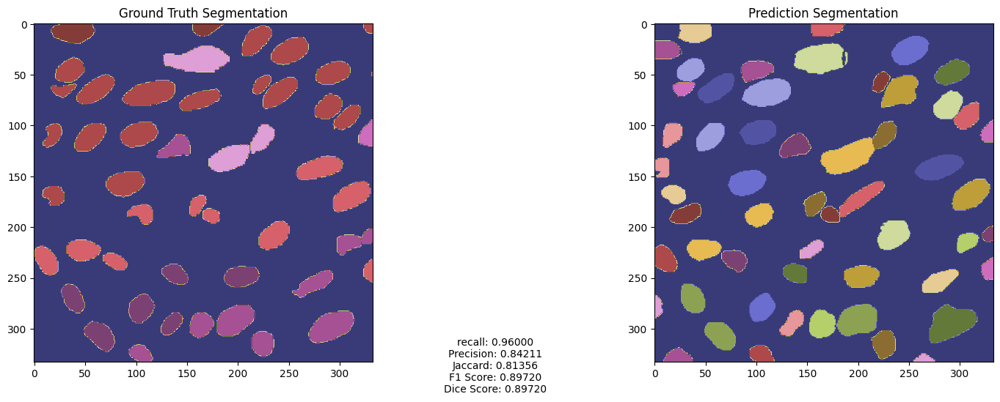

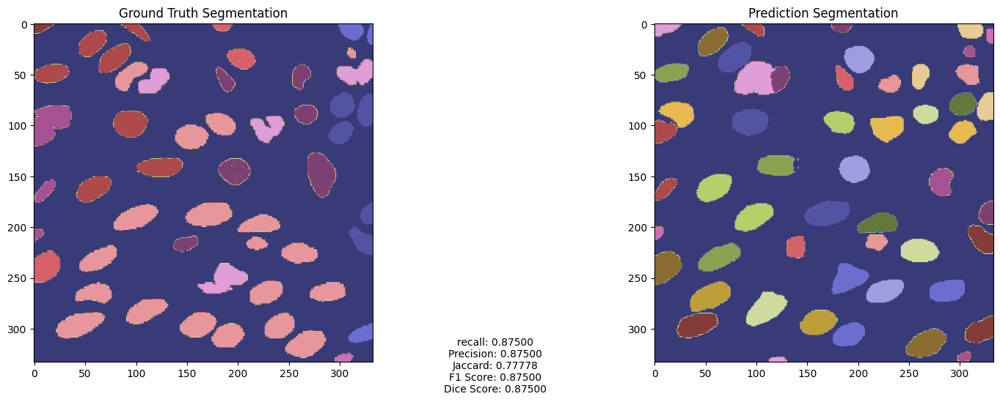

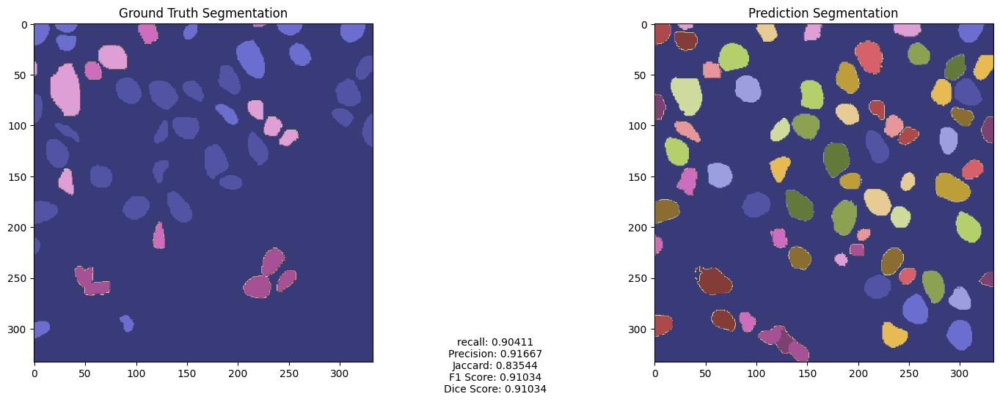

In [18]:
# Calculate the Jaccard, precision, recall, F1 score and dice score

# Initialize lists to store metrics for each image
jaccards = []
precisions = []
recalls = []
f1_scores = []
dices = []
ious = []
ajis = []  
segs = [] 

for i, (orig_img, true_img, pred_img) in enumerate(zip(X_test, y_true, CenterSAM_predict_result)):
    print(f"Processing image {i + 1}/{len(y_true)}...")
    visualize_comparison(orig_img, true_img.squeeze(), pred_img.squeeze(), i)
    
    # Compute metrics for the current image
    jaccard, precision, recall, f1, dice, _, image_ious = compute_instance_metrics(true_img.squeeze(), pred_img.squeeze())
    aji = compute_aji(true_img.squeeze(), pred_img.squeeze())
    seg = compute_seg(true_img.squeeze(), pred_img.squeeze())
    
    
    
    # Append the metrics to the lists
    jaccards.append(jaccard)
    precisions.append(precision)
    recalls.append(recall)
    f1_scores.append(f1)
    dices.append(dice)
    ious.extend(image_ious)
    ajis.append(aji)
    segs.append(seg)
    
    print('AJI: ' + str(aji))
    print('SEG: ' + str(seg))
    print('recall: ' + str(recall))
    print('precision: ' + str(precision))
    print('jaccard: ' + str(jaccard))
    print('f1: ' + str(f1))
    print('dice: ' + str(dice))

# Compute the average of the metrics over all images


avg_recall = np.mean(recalls)
avg_precision = np.mean(precisions)
avg_jaccard = np.mean(jaccards)
avg_f1 = np.mean(f1_scores)
avg_dice = np.mean(dices)
avg_iou = np.mean(ious)
avg_aji = np.mean(ajis)
avg_seg = np.mean(segs)

print("\nOverall Evaluation Metrics:")
print(f"Average Recall: {avg_recall:.5f}")
print(f"Average Precision: {avg_precision:.5f}")
print(f"Average Jaccard: {avg_jaccard:.5f}")
print(f"Average F1 Score: {avg_f1:.5f}")
print(f"Average Dice Score: {avg_dice:.5f}")
print(f"Average IoU: {avg_iou:.5f}")
print(f"Average AJI: {avg_aji:.5f}")
print(f"Average SEG: {avg_seg:.5f}")